In [1]:
import numpy as np
from numpy import linalg as la
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
np.set_printoptions(precision=5, suppress=True)
import pandas as pd
import numpy as np
import re
import sklearn
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

import warnings
warnings.filterwarnings('ignore')

# Going to use these 5 base models for the stacking
from sklearn.ensemble import (RandomForestClassifier, AdaBoostClassifier, 
                              GradientBoostingClassifier, ExtraTreesClassifier)
from sklearn.svm import SVC
from sklearn.cross_validation import KFold
import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()
from plotly import tools

# import cufflinks and offline mode
import cufflinks as cf
cf.go_offline()

In [2]:
raw_data = pd.read_table('DS/SVD/cancel_before_answer_cityid.csv',
                        sep='\t', header=0)
raw_data.head()

,a.grid_id,cancel_rate_1,cancel_rate_2,cancel_rate_3,cancel_rate_4,cancel_rate_5,cancel_rate_6,cancel_rate_7,cancel_rate_8,cancel_rate_9,...,cancel_rate_135,cancel_rate_136,cancel_rate_137,cancel_rate_138,cancel_rate_139,cancel_rate_140,cancel_rate_141,cancel_rate_142,cancel_rate_143,cancel_rate_144
0,OL13F1i4945j2561,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,OL13F1i4945j2562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,OL13F1i4946j2561,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,OL13F1i4946j2562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,OL13F1i4947j2560,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
raw_data.shape

(6030, 145)

In [4]:
mis_val = raw_data.iloc[:, 1:].isnull().sum(axis=1)

In [5]:
mis_percent = 100*raw_data.iloc[:, 1:].isnull().sum(axis=1)/raw_data.iloc[:, 1:].shape[1]

In [6]:
mis_val_table = pd.concat([mis_val, mis_percent], axis=1)

In [7]:
mis_val_table = mis_val_table.rename(columns={0:'missing_values', 1:'missing_percentages'})

In [8]:
data = pd.concat([raw_data, mis_val_table], axis=1)

In [9]:
data.head()

,a.grid_id,cancel_rate_1,cancel_rate_2,cancel_rate_3,cancel_rate_4,cancel_rate_5,cancel_rate_6,cancel_rate_7,cancel_rate_8,cancel_rate_9,...,cancel_rate_137,cancel_rate_138,cancel_rate_139,cancel_rate_140,cancel_rate_141,cancel_rate_142,cancel_rate_143,cancel_rate_144,missing_values,missing_percentages
0,OL13F1i4945j2561,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,142,98.611111
1,OL13F1i4945j2562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,124,86.111111
2,OL13F1i4946j2561,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,140,97.222222
3,OL13F1i4946j2562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,141,97.916667
4,OL13F1i4947j2560,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,144,100.000000


In [10]:
data_selected = data.query('missing_percentages <= 50')

In [11]:
data_selected.shape

(2269, 147)

In [12]:
data_selected = data_selected.fillna(0)

In [13]:
data_selected.describe()

,cancel_rate_1,cancel_rate_2,cancel_rate_3,cancel_rate_4,cancel_rate_5,cancel_rate_6,cancel_rate_7,cancel_rate_8,cancel_rate_9,cancel_rate_10,...,cancel_rate_137,cancel_rate_138,cancel_rate_139,cancel_rate_140,cancel_rate_141,cancel_rate_142,cancel_rate_143,cancel_rate_144,missing_values,missing_percentages
count,2269.000000,2269.000000,2269.000000,2269.000000,2269.000000,2269.000000,2269.000000,2269.000000,2269.000000,2269.000000,...,2269.000000,2269.000000,2269.000000,2269.000000,2269.000000,2269.000000,2269.000000,2269.000000,2269.000000,2269.000000
mean,0.099611,0.102473,0.095803,0.090382,0.087175,0.081644,0.090653,0.073307,0.086939,0.079742,...,0.107413,0.099696,0.097125,0.098111,0.092618,0.088763,0.078309,0.061370,20.606435,14.310024
std,0.201038,0.202555,0.198607,0.194731,0.192782,0.190666,0.212803,0.183698,0.210409,0.196135,...,0.186479,0.182085,0.183551,0.187421,0.178373,0.180340,0.178242,0.144349,22.269548,15.464964
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000,8.333333
75%,0.111111,0.119048,0.098361,0.090909,0.075949,0.052632,0.058824,0.037037,0.052632,0.038835,...,0.150000,0.125000,0.116505,0.116129,0.117647,0.100196,0.075000,0.052632,36.000000,25.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,72.000000,50.000000


In [14]:
data_selected.iloc[:, 1:-2].T.describe()

,16,284,314,348,374,375,386,387,390,399,...,5813,5814,5816,5817,5826,5834,5842,5855,5903,5999
count,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,...,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000
mean,0.265841,0.148392,0.127199,0.084234,0.021029,0.058681,0.116917,0.152414,0.277728,0.043436,...,0.067187,0.123198,0.195255,0.196038,0.090063,0.140162,0.090220,0.080903,0.094659,0.240600
std,0.355376,0.296765,0.277747,0.219970,0.094746,0.193041,0.256070,0.316088,0.394953,0.149550,...,0.220449,0.281111,0.357121,0.258250,0.216007,0.278248,0.229767,0.218020,0.241703,0.370761
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,...,0.000000,0.000000,0.250000,0.333333,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143]), <a list of 144 Text xticklabel objects>)

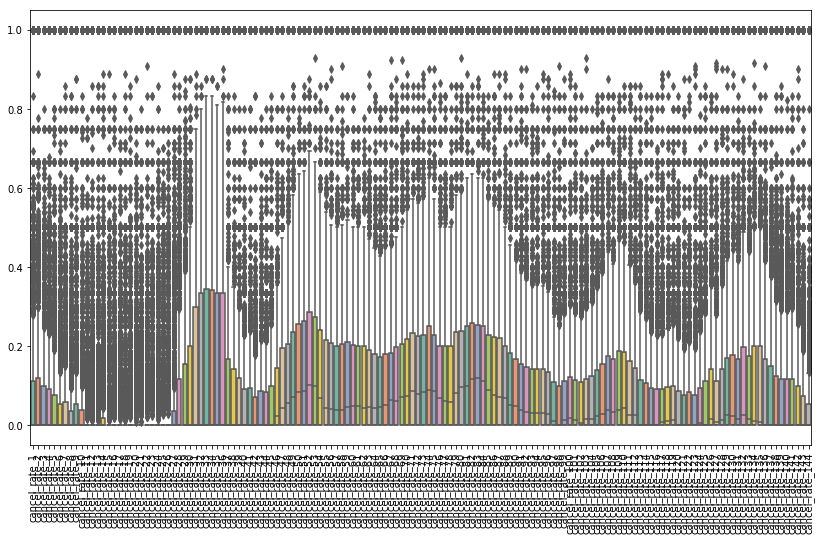

In [15]:
plt.figure(figsize=(14,8))
g = sns.boxplot(data=data_selected.iloc[:, 1:-2], palette='Set2')
plt.xticks(rotation=90)

In [16]:
# generate the final dataset for modeling
df = data_selected.iloc[:, 1:-2]

## SVD 矩阵

In [17]:
x = df.values

In [18]:
u, s, v = np.linalg.svd(np.sqrt(x), full_matrices=False)

In [19]:
print(u.shape)
print(s.shape)
print(v.shape)

(2269, 144)
(144,)
(144, 144)


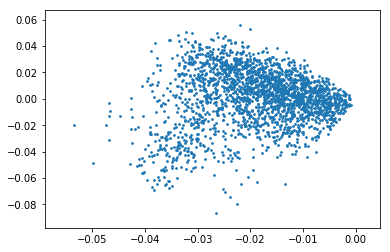

In [20]:
plt.scatter(u[:, 0], u[:, 1], s=3.0)
plt.show()

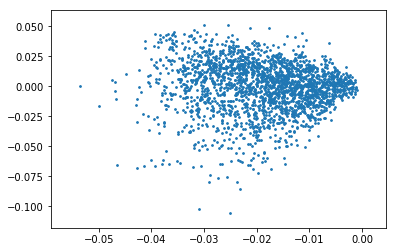

In [21]:
plt.scatter(u[:, 0], u[:, 2], s=3.0)
plt.show()

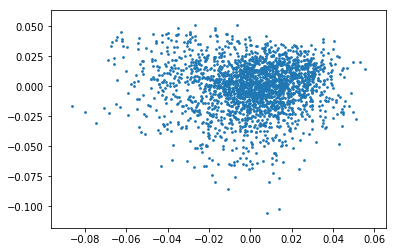

In [22]:
plt.scatter(u[:, 1], u[:, 2], s=3.0)
plt.show()

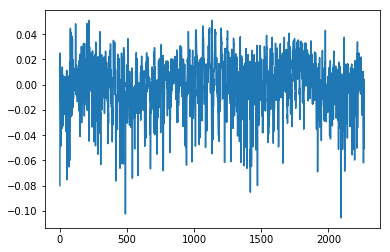

In [23]:
plt.plot(u[:, 2], label='u0')
plt.show()

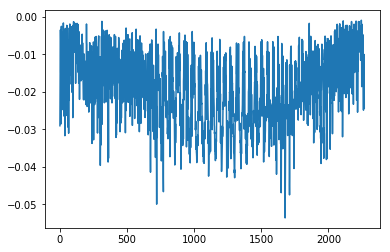

In [24]:
plt.plot(u[:, 0], label='u0')
plt.show()

In [25]:
group = x.mean(axis=1)*0
len(group)

2269

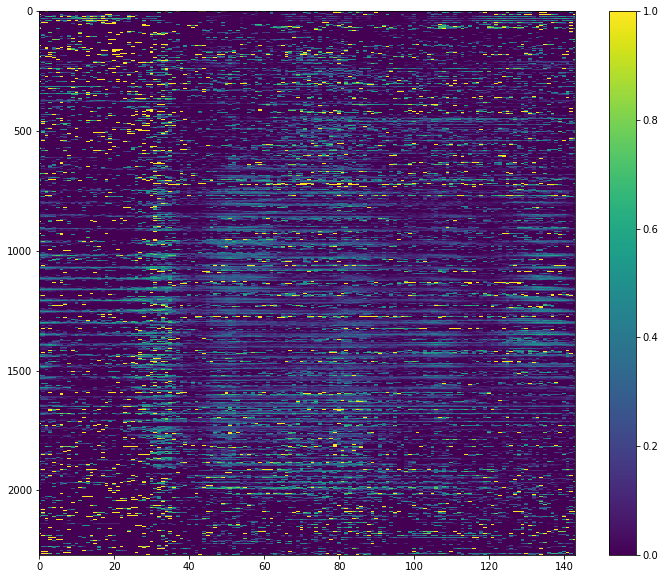

In [26]:
plt.figure(figsize=(12,10))
plt.imshow(x[:, :], aspect='auto')
plt.xlim(0,143)
plt.colorbar()
plt.show()

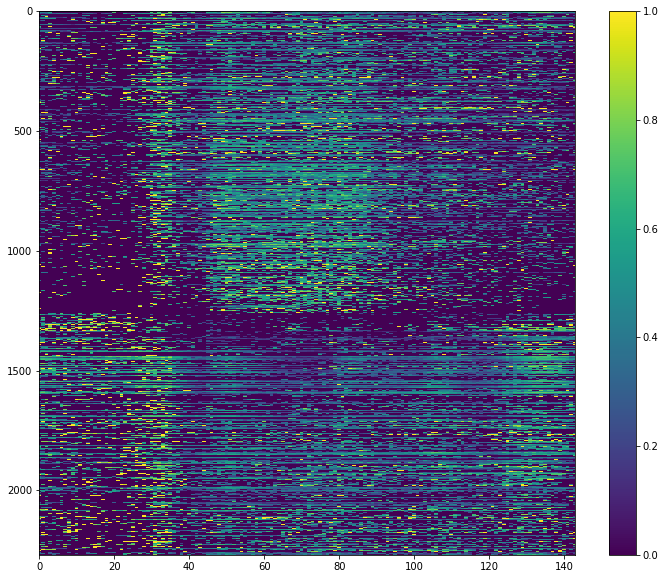

In [27]:
idx = np.argsort(u[:, 0]/u[:, 1]) # u矩阵第一列是magnitude, u矩阵第2列为方差 var
plt.figure(figsize=(12,10))
plt.imshow(np.sqrt(x[idx, :]), aspect='auto')
plt.xlim(0,143)
plt.colorbar()
plt.show()

In [28]:
t_square_total = 0
a = []
k = []
for i in range(len(s)):
    t = s[i]
    t_square = t*t
    t_square_total = t_square_total + t_square
    a.append(t_square_total)
    k.append(i)
    
(a/a[-1])[:10]

array([0.52349, 0.56288, 0.58762, 0.60004, 0.61075, 0.61946, 0.62631,
       0.63249, 0.63857, 0.64438])

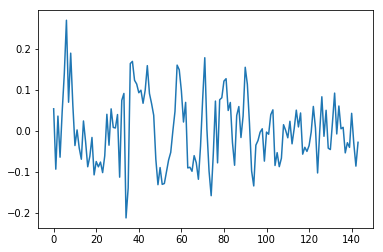

In [29]:
plt.plot(v[20, :], label='v0')

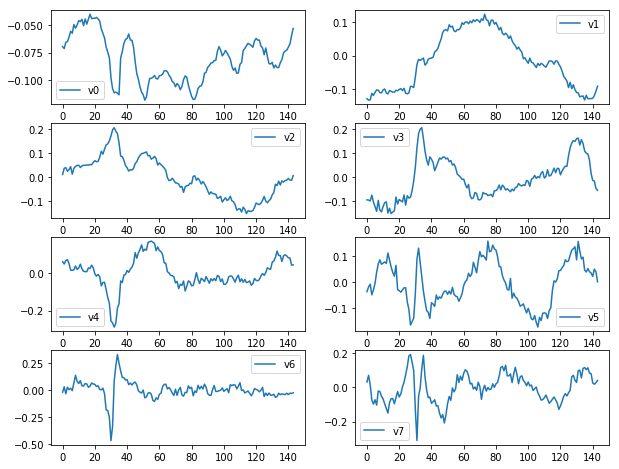

In [30]:
plt.figure(figsize=(10,8))
plt.subplot(4,2,1)
plt.plot(v[0, :], label='v0')
plt.legend()

plt.subplot(4,2,2)
plt.plot(v[1, :], label='v1')
plt.legend()

plt.subplot(4,2,3)
plt.plot(v[2, :], label='v2')
plt.legend()

plt.subplot(4,2,4)
plt.plot(v[3, :], label='v3')
plt.legend()

plt.subplot(4,2,5) ## 从图5开始图形出现信息周期波动，后面解释的信息量太少成为噪音
plt.plot(v[4, :], label='v4')
plt.legend()

plt.subplot(4,2,6)
plt.plot(v[5, :], label='v5')
plt.legend()

plt.subplot(4,2,7)
plt.plot(v[6, :], label='v6')
plt.legend()

plt.subplot(4,2,8)
plt.plot(v[7, :], label='v7')
plt.legend()

In [31]:
v0 = v[0, :]
v1 = v[1, :]
v2 = v[2, :]
# v3 = v[3, :]

corr0 = []
corr1 = []
corr2 = []
# corr3 = []

for i in range(len(x)):
    corr0.append((np.corrcoef(x[i], v0))[0][1])
    corr1.append((np.corrcoef(x[i], v1))[0][1])
    corr2.append((np.corrcoef(x[i], v2))[0][1])
    #corr3.append((np.corrcoef(x[i], v3))[0][1])

In [32]:
t = pd.concat([data_selected['a.grid_id'],
              pd.Series(corr0, index=data_selected.index),
              pd.Series(corr1, index=data_selected.index),
              pd.Series(corr2, index=data_selected.index)], axis=1)
t.columns = ['grid_id', 'v0', 'v1', 'v2']
t.fillna(0)
t.head()

,grid_id,v0,v1,v2
16,OL13F1i4953j2552,-0.148807,-0.003686,-0.444817
284,OL13F1i4990j2525,-0.127641,0.200749,0.173574
314,OL13F1i4991j2525,-0.095022,0.070274,0.179638
348,OL13F1i4992j2532,-0.175927,0.270161,-0.105585
374,OL13F1i4993j2532,0.120804,-0.064559,-0.020276


In [33]:
t.shape

(2269, 4)

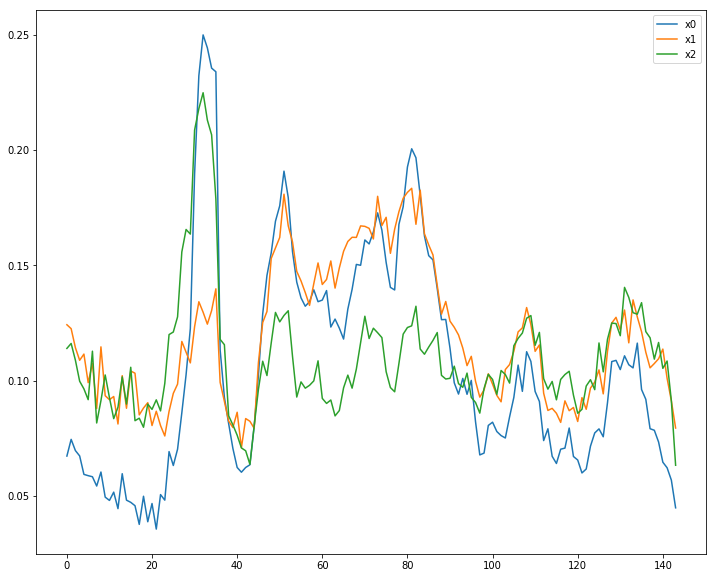

In [34]:
x_corr = np.abs(t.iloc[:, 1:].values)
max_corr = x_corr.max(axis=1)

group=x.mean(axis=1)*0
group[x_corr[:, 0]==max_corr]=0
group[x_corr[:, 1]==max_corr]=1
group[x_corr[:, 2]==max_corr]=2
#group[x_corr[:, 3]==max_corr]=3


idgrp = pd.concat([data_selected['a.grid_id'],
                  pd.Series(group, index=data_selected.index)], axis=1)
idgrp.columns = ['grid_id', 'group_id']

x0 = x[group==0, :].mean(axis=0)
x1 = x[group==1, :].mean(axis=0)
x2 = x[group==2, :].mean(axis=0)
#x3 = x[group==3, :].mean(axis=0)


plt.figure(figsize=(12,10))

plt.subplot(111)
plt.plot(x0[:144], label='x0')
plt.plot(x1[:144], label='x1')
plt.plot(x2[:144], label='x2')
#plt.plot(x3[:144], label='x3')


plt.legend()
plt.show()

In [35]:
def donut_chart(df, feature):
    temp = df[feature].value_counts()
    df = pd.DataFrame({'labels': temp.index.sort_values(ascending=True),
                      'values': temp.values
                      })
    df.iplot(kind='pie', labels='labels', values='values', title='drivers by group', hole=0.7)

In [36]:
#donut_chart(idgrp, 'group_id')

ValueError: 
    Invalid value of type 'builtins.str' received for the 'bgcolor' property of layout.legend
        Received value: 'pearl02'

    The 'bgcolor' property is a color and may be specified as:
      - A hex string (e.g. '#ff0000')
      - An rgb/rgba string (e.g. 'rgb(255,0,0)')
      - An hsl/hsla string (e.g. 'hsl(0,100%,50%)')
      - An hsv/hsva string (e.g. 'hsv(0,100%,100%)')
      - A named CSS color:
            aliceblue, antiquewhite, aqua, aquamarine, azure,
            beige, bisque, black, blanchedalmond, blue,
            blueviolet, brown, burlywood, cadetblue,
            chartreuse, chocolate, coral, cornflowerblue,
            cornsilk, crimson, cyan, darkblue, darkcyan,
            darkgoldenrod, darkgray, darkgrey, darkgreen,
            darkkhaki, darkmagenta, darkolivegreen, darkorange,
            darkorchid, darkred, darksalmon, darkseagreen,
            darkslateblue, darkslategray, darkslategrey,
            darkturquoise, darkviolet, deeppink, deepskyblue,
            dimgray, dimgrey, dodgerblue, firebrick,
            floralwhite, forestgreen, fuchsia, gainsboro,
            ghostwhite, gold, goldenrod, gray, grey, green,
            greenyellow, honeydew, hotpink, indianred, indigo,
            ivory, khaki, lavender, lavenderblush, lawngreen,
            lemonchiffon, lightblue, lightcoral, lightcyan,
            lightgoldenrodyellow, lightgray, lightgrey,
            lightgreen, lightpink, lightsalmon, lightseagreen,
            lightskyblue, lightslategray, lightslategrey,
            lightsteelblue, lightyellow, lime, limegreen,
            linen, magenta, maroon, mediumaquamarine,
            mediumblue, mediumorchid, mediumpurple,
            mediumseagreen, mediumslateblue, mediumspringgreen,
            mediumturquoise, mediumvioletred, midnightblue,
            mintcream, mistyrose, moccasin, navajowhite, navy,
            oldlace, olive, olivedrab, orange, orangered,
            orchid, palegoldenrod, palegreen, paleturquoise,
            palevioletred, papayawhip, peachpuff, peru, pink,
            plum, powderblue, purple, red, rosybrown,
            royalblue, saddlebrown, salmon, sandybrown,
            seagreen, seashell, sienna, silver, skyblue,
            slateblue, slategray, slategrey, snow, springgreen,
            steelblue, tan, teal, thistle, tomato, turquoise,
            violet, wheat, white, whitesmoke, yellow,
            yellowgreen

In [37]:
idx = np.argsort(group + u[:, 2])
idx

array([ 820,  557, 1010, ...,  201,  215, 1135])

In [38]:
group_nums = idgrp.groupby('group_id').count().reset_index().cumsum()
group_nums

,group_id,grid_id
0,0.0,852.0
1,1.0,1558.0
2,3.0,2269.0


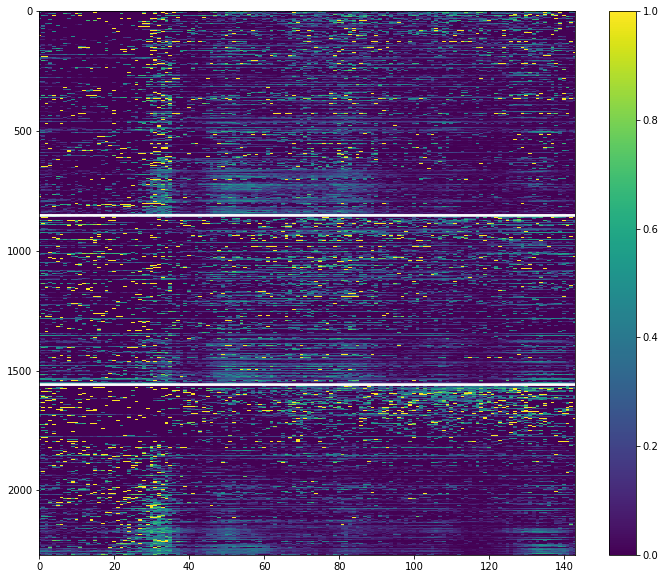

In [39]:
# plot the groupped driver
plt.figure(figsize=(12,10))
plt.imshow(x[idx, :], aspect='auto')
plt.hlines(y=int(group_nums['grid_id'][0]) - 1, xmin=0, xmax=144, color='white')
plt.hlines(y=int(group_nums['grid_id'][0]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['grid_id'][0])+1, xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['grid_id'][1]-1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['grid_id'][1]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['grid_id'][1]+1), xmin=0, xmax=144,color='white')
#plt.hlines(y=int(group_nums['grid_id'][2]-1), xmin=0, xmax=144,color='white')
#plt.hlines(y=int(group_nums['grid_id'][2]), xmin=0, xmax=144,color='white')
#plt.hlines(y=int(group_nums['grid_id'][2]+1), xmin=0, xmax=144,color='white')

plt.xlim(0,143)
plt.colorbar()
plt.show()

In [40]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist

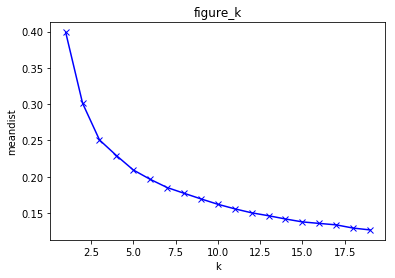

In [41]:
x_train = t.iloc[:, 1:].values
K = range(1,20)
meandist = []

for k in K:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(x_train)
    meandist.append(sum(np.min(cdist(x_train,
                                    kmeans.cluster_centers_,
                                    'euclidean'), axis=1))/x_train.shape[0])
plt.plot(K, meandist, 'bx-')
plt.xlabel('k')
plt.ylabel('meandist')
plt.title('figure_k')
plt.show()

In [43]:
kmeans_3 = KMeans(n_clusters=3, random_state=100).fit(x_train)
kmeans_group_out = kmeans_3.labels_

In [44]:
data_kmeans_3 = pd.concat([data_selected['a.grid_id'],
                          pd.Series(kmeans_group_out, index=data_selected.index)], axis=1)
data_kmeans_3.columns = ['grid_id', 'group_id']

In [45]:
#donut_chart(data_kmeans_3, 'group_id')

ValueError: 
    Invalid value of type 'builtins.str' received for the 'bgcolor' property of layout.legend
        Received value: 'pearl02'

    The 'bgcolor' property is a color and may be specified as:
      - A hex string (e.g. '#ff0000')
      - An rgb/rgba string (e.g. 'rgb(255,0,0)')
      - An hsl/hsla string (e.g. 'hsl(0,100%,50%)')
      - An hsv/hsva string (e.g. 'hsv(0,100%,100%)')
      - A named CSS color:
            aliceblue, antiquewhite, aqua, aquamarine, azure,
            beige, bisque, black, blanchedalmond, blue,
            blueviolet, brown, burlywood, cadetblue,
            chartreuse, chocolate, coral, cornflowerblue,
            cornsilk, crimson, cyan, darkblue, darkcyan,
            darkgoldenrod, darkgray, darkgrey, darkgreen,
            darkkhaki, darkmagenta, darkolivegreen, darkorange,
            darkorchid, darkred, darksalmon, darkseagreen,
            darkslateblue, darkslategray, darkslategrey,
            darkturquoise, darkviolet, deeppink, deepskyblue,
            dimgray, dimgrey, dodgerblue, firebrick,
            floralwhite, forestgreen, fuchsia, gainsboro,
            ghostwhite, gold, goldenrod, gray, grey, green,
            greenyellow, honeydew, hotpink, indianred, indigo,
            ivory, khaki, lavender, lavenderblush, lawngreen,
            lemonchiffon, lightblue, lightcoral, lightcyan,
            lightgoldenrodyellow, lightgray, lightgrey,
            lightgreen, lightpink, lightsalmon, lightseagreen,
            lightskyblue, lightslategray, lightslategrey,
            lightsteelblue, lightyellow, lime, limegreen,
            linen, magenta, maroon, mediumaquamarine,
            mediumblue, mediumorchid, mediumpurple,
            mediumseagreen, mediumslateblue, mediumspringgreen,
            mediumturquoise, mediumvioletred, midnightblue,
            mintcream, mistyrose, moccasin, navajowhite, navy,
            oldlace, olive, olivedrab, orange, orangered,
            orchid, palegoldenrod, palegreen, paleturquoise,
            palevioletred, papayawhip, peachpuff, peru, pink,
            plum, powderblue, purple, red, rosybrown,
            royalblue, saddlebrown, salmon, sandybrown,
            seagreen, seashell, sienna, silver, skyblue,
            slateblue, slategray, slategrey, snow, springgreen,
            steelblue, tan, teal, thistle, tomato, turquoise,
            violet, wheat, white, whitesmoke, yellow,
            yellowgreen

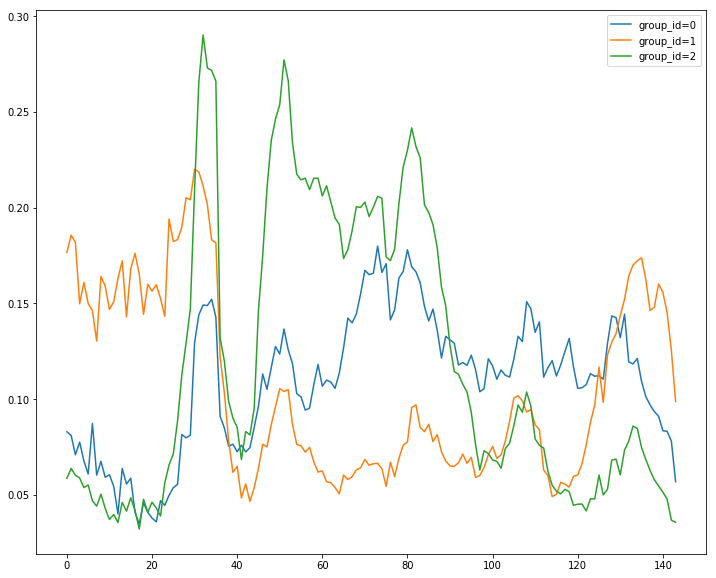

In [46]:
x0 = x[kmeans_group_out==0, :].mean(axis=0)
x1 = x[kmeans_group_out==1, :].mean(axis=0)
x2 = x[kmeans_group_out==2, :].mean(axis=0)
#x3 = x[kmeans_group_out==3, :].mean(axis=0)
#x4 = x[kmeans_group_out==4, :].mean(axis=0)
#x5 = x[kmeans_group_out==5, :].mean(axis=0)
#x6 = x[kmeans_group_out==6, :].mean(axis=0)
#x7 = x[kmeans_group_out==7, :].mean(axis=0)
#x8 = x[kmeans_group_out==8, :].mean(axis=0)
#x9 = x[kmeans_group_out==9, :].mean(axis=0)
#x10 = x[kmeans_group_out==10, :].mean(axis=0)

plt.figure(figsize=(12,10))

plt.subplot(111)
plt.plot(x0[:144], label='group_id=0')
plt.plot(x1[:144], label='group_id=1')
plt.plot(x2[:144], label='group_id=2')
#plt.plot(x3[:144], label='group_id=3')
#plt.plot(x4[:144], label='group_id=4')
#plt.plot(x5[:144], label='group_id=5')
#plt.plot(x6[:144], label='group_id=6')
#plt.plot(x7[:144], label='group_id=7')
#plt.plot(x8[:144], label='group_id=8')
#plt.plot(x9[:144], label='group_id=9')
#plt.plot(x10[:144], label='group_id=10')

plt.legend()
plt.show()

In [47]:
group_nums_3 = data_kmeans_3.groupby('group_id').count().reset_index().cumsum()
group_nums_3

,group_id,grid_id
0,0,1057
1,1,1628
2,3,2269


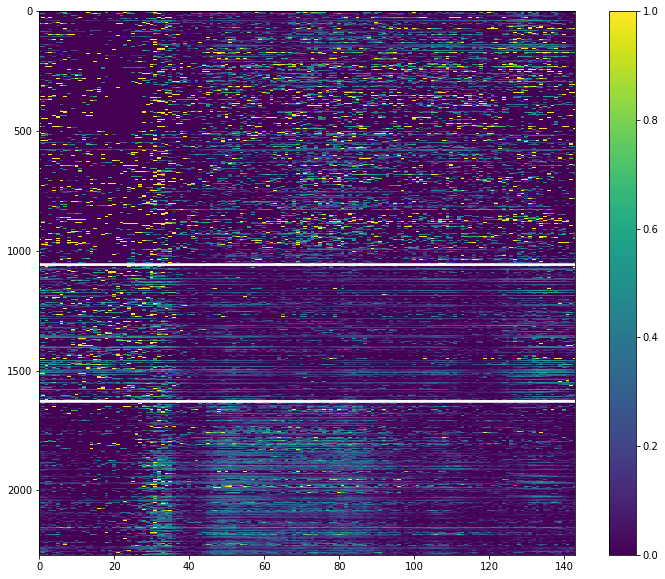

In [48]:
idx4 = np.argsort(kmeans_group_out)
plt.figure(figsize=(12, 10))
plt.imshow(x[idx4, :], aspect='auto')
plt.hlines(y=int(group_nums_3['grid_id'][0])-1, xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums_3['grid_id'][0]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums_3['grid_id'][0])+1, xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums_3['grid_id'][1]-1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums_3['grid_id'][1]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums_3['grid_id'][1]+1), xmin=0, xmax=144,color='white')
#plt.hlines(y=int(group_nums_4['grid_id'][2]-1), xmin=0, xmax=144,color='white')
#plt.hlines(y=int(group_nums_4['grid_id'][2]), xmin=0, xmax=144,color='white')
#plt.hlines(y=int(group_nums_4['grid_id'][2]+1), xmin=0, xmax=144,color='white')

plt.xlim(0,143)
plt.colorbar()
plt.show()